## UPLOADING IMPORTANT LIBRARIES

In [ ]:
!pip install -q transformers

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from PIL import Image
import librosa
import IPython.display as ipd
import torch
import torch.nn as nn
from tqdm.auto import tqdm
import torch
from PIL import Image
import joblib
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import requests
import cv2
import torch
import urllib.request
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch
import torch.nn as nn
import torch.nn.functional as F


## DAQUAR DATASET (DAtaset for QUestion Answering on Real-world images)

In [ ]:
dataset = pd.read_csv('/content/data_train (1).csv')
dataset.head()

,question,answer,image_id
0,what is on the right side of the black telepho...,desk,image3
1,what is in front of the white door on the left...,telephone,image3
2,what is on the desk,"book, scissor, papers, tape_dispenser",image3
3,what is the largest brown objects,carton,image3
4,what color is the chair in front of the white ...,red,image3


In [ ]:
dataset.tail()

,question,answer,image_id
6790,what are stuck on the wall,photo,image1440
6791,what is in the top right corner,window,image1440
6792,what is in front of the window,cabinet,image1440
6793,what are the things on the cabinet,"candelabra, book",image1440
6794,what are around the dining table,chair,image1440


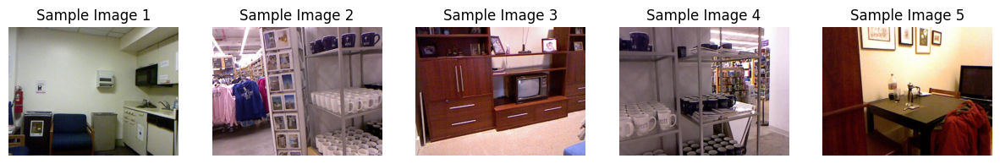

In [ ]:
image_paths = ["image1","image100","image1005","image101","image200"]
# Plot sample images
num_samples = 5  # Number of sample images to plot
plt.figure(figsize=(15, 8))
for i in range(num_samples):
    # Open the image using PIL
    img = Image.open("/kaggle/input/processed-daquar-dataset/images/" + image_paths[i] + ".png")

    # Plot the image
    plt.subplot(1, num_samples, i + 1)
    plt.imshow(img)
    plt.title("Sample Image " + str(i + 1))
    plt.axis('off')  # Hide axis
plt.show()

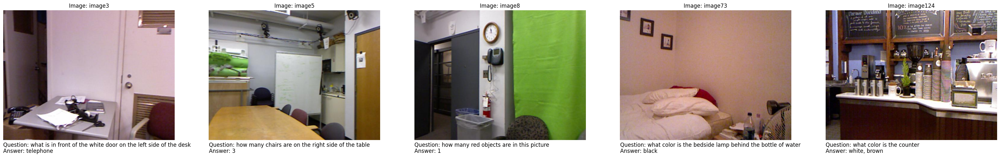

In [ ]:
num_images_to_plot = 5
fig, axes = plt.subplots(1, num_images_to_plot, figsize=(40, 30))
j = 0
images = [1,12,25,70,100]
for i in images:
    img = Image.open("/kaggle/input/processed-daquar-dataset/images/" + dataset.loc[i, 'image_id'] + ".png")
    axes[j].imshow(img)
    axes[j].set_title("Image: " + dataset.loc[i, 'image_id'])
    axes[j].axis('off')
    axes[j].text(0, img.height + 20, "Question: " +dataset.loc[i, 'question'], fontsize=12, wrap=True)
    axes[j].text(0, img.height + 40, "Answer: " + dataset.loc[i, 'answer'], fontsize=12, wrap=True)
    j = j + 1

plt.show()

In [ ]:
test_dataset = pd.read_csv('/kaggle/input/processed-daquar-dataset/data_eval.csv')
test_dataset.head()

,question,answer,image_id
0,what is on the left side of the white oven on ...,garbage_bin,image1
1,what is on the left side of the fire extinguis...,table,image1
2,what is between the the two white and black ga...,chair,image1
3,how many objects are between the fire extingui...,3,image1
4,what is the largest object in this picture,washing_machine,image1


# VILT PRE TRAINED MODEL (HUGGING FACE) FOR FINETUNING

The config object instantiated from ViltConfig holds the configuration settings for the VILT (Vision-and-Language Transformer) model pretrained on VQA (Visual Question Answering) tasks, specifically the dandelin/vilt-b32-finetuned-vqa model. These settings include parameters such as the model architecture, tokenization strategy, input features, and task-specific settings like the number of labels in VQA.

In [ ]:
from transformers import ViltConfig
config = ViltConfig.from_pretrained("dandelin/vilt-b32-finetuned-vqa")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/136k [00:00<?, ?B/s]

In [ ]:
from transformers import ViltProcessor
processor = ViltProcessor.from_pretrained("dandelin/vilt-b32-finetuned-vqa")

preprocessor_config.json:   0%|          | 0.00/251 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/320 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
new_label2id = {}
for label, id_ in config.label2id.items():
    new_label2id[label] = id_
start_id = max(config.label2id.values()) + 1
new_label_id = start_id
for annotation in dataset['answer']:
    answers = annotation.split(",")
    for answer in answers:
        if answer[0] == " ":
            answer = answer[1:]
        answer = answer.replace("_", " ")
        if answer not in list(new_label2id.keys()):
            new_label2id[answer] = new_label_id
            new_label_id = new_label_id + 1
config.label2id = new_label2id


In [ ]:
config.label2id['cup']

1219

In [ ]:
configid2label = {}
configid2label = {v: k for k, v in new_label2id.items()}
config.id2label = configid2label

In [ ]:
config.id2label[0]

'net'

## DATASET LOADER

In [ ]:
import torch
from PIL import Image

class VQADataset(torch.utils.data.Dataset):
    """VQA (v2) dataset."""

    def __init__(self, processor,examples):
        # self.questions = questions
        self.annotations = examples['answer']
        self.processor = processor
        self.examples = examples

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self,idx):
        # get image + text
        annotation = self.examples["answer"].iloc[idx]
        questions = self.examples["question"].iloc[idx]
        image_paths = [self.examples["image_id"].iloc[idx]]
        images = [Image.open("/kaggle/input/processed-daquar-dataset/images/"+image_path+".png") for image_path in image_paths]
        texts = self.examples["question"].iloc[idx]

        encoding = processor(images, texts, padding="max_length", truncation=True, return_tensors="pt")

        for k, v in encoding.items():
              encoding[k] = v.squeeze()

        targets = torch.zeros(len(config.id2label))
        labels = annotation.split(",")
        for answer in labels:
            answer = answer.replace("_", " ")
            if answer[0] == " ":
                answer = answer[1:]
            targets[config.label2id[answer]] = 1

        encoding["labels"] = targets

        return encoding

In [ ]:
df = VQADataset(processor=processor,examples=dataset)

In [ ]:
print(df[100])

{'input_ids': tensor([ 101, 2054, 3609, 2003, 1996, 4675,  102,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0]), 'token_type_ids': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), 'pixel_values': tensor([[[-0.7412, -0.6784, -0.6549,  ..., -0.1216, -0.1843, -0.1451],
         [-0.7490, -0.6627, -0.6392,  ..., -0.0667, -0.1137, -0.1059],
         [-0.7569, -0.6549, -0.6471,  ..., -0.0588, -0.0902, -0.1451],
         ...,
         [-0.4039, -0.3961, -0.3804,  ..., -0.6157, -0.6157, -0.6157],
         [-0.4039, -0.4039, -0.3961,  ..., -0.6235, -0.6235, -0.6235],
         [-0.36

In [ ]:
processor.decode(df[1000]['input_ids'])

'[CLS] what is the object on the floor in the corner [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]'

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
        input_ids = [item['input_ids'] for item in batch]
        pixel_values = [item['pixel_values'] for item in batch]
        attention_mask = [item['attention_mask'] for item in batch]
        token_type_ids = [item['token_type_ids'] for item in batch]
        labels = [item['labels'] for item in batch]

      # create padded pixel values and corresponding pixel mask
        encoding = processor.image_processor.pad(pixel_values, return_tensors="pt")

      # create new batch
        batch = {}
        batch['input_ids'] = torch.stack(input_ids)
        batch['attention_mask'] = torch.stack(attention_mask)
        batch['token_type_ids'] = torch.stack(token_type_ids)
        batch['pixel_values'] = encoding['pixel_values']
        batch['pixel_mask'] = encoding['pixel_mask']
        batch['labels'] = torch.stack(labels)

        return batch

train_dataloader = DataLoader(df, collate_fn=collate_fn, batch_size=16, shuffle=True)

In [ ]:
batch = next(iter(train_dataloader))

In [ ]:
for k,v in batch.items():
  print(k, v.shape)

input_ids torch.Size([16, 40])
attention_mask torch.Size([16, 40])
token_type_ids torch.Size([16, 40])
pixel_values torch.Size([16, 3, 384, 480])
pixel_mask torch.Size([16, 384, 480])
labels torch.Size([16, 3422])


## FINETUNING OF vilt MODEL

In [ ]:
from transformers import ViltForQuestionAnswering

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from transformers import ViltForQuestionAnswering
model = ViltForQuestionAnswering.from_pretrained("dandelin/vilt-b32-finetuned-vqa",id2label=config.id2label,
                                                 label2id=config.label2id,ignore_mismatched_sizes=True)
model.to(device)

pytorch_model.bin:   0%|          | 0.00/470M [00:00<?, ?B/s]

Some weights of ViltForQuestionAnswering were not initialized from the model checkpoint at dandelin/vilt-b32-finetuned-vqa and are newly initialized because the shapes did not match:
- classifier.3.weight: found shape torch.Size([3129, 1536]) in the checkpoint and torch.Size([3422, 1536]) in the model instantiated
- classifier.3.bias: found shape torch.Size([3129]) in the checkpoint and torch.Size([3422]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViltForQuestionAnswering(
  (vilt): ViltModel(
    (embeddings): ViltEmbeddings(
      (text_embeddings): TextEmbeddings(
        (word_embeddings): Embedding(30522, 768)
        (position_embeddings): Embedding(40, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (patch_embeddings): ViltPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
      )
      (token_type_embeddings): Embedding(2, 768)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViltEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViltLayer(
          (attention): ViltAttention(
            (attention): ViltSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=76

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
model.train()
for epoch in range(20):  # loop over the dataset multiple times
   print(f"Epoch: {epoch}")
   for batch in tqdm(train_dataloader):
        # get the inputs;
        batch = {k:v.to(device) for k,v in batch.items()}

        # zero the parameter gradients
        optimizer.zero_grad()
        # print(len(batch))
        # forward + backward + optimize
        outputs = model(**batch)
        loss = outputs.loss
        print("Loss:", loss.item())
        loss.backward()
        optimizer.step()

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
model.train()
for epoch in range(20):  # loop over the dataset multiple times
   print(f"Epoch: {epoch}")
   for batch in tqdm(train_dataloader):
        # get the inputs;
        batch = {k:v.to(device) for k,v in batch.items()}

        # zero the parameter gradients
        optimizer.zero_grad()
        # print(len(batch))
        # forward + backward + optimize
        outputs = model(**batch)
        loss = outputs.loss
        print("Loss:", loss.item())
        loss.backward()
        optimizer.step()

Epoch: 0


  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 3.5598278045654297
Loss: 4.213293075561523
Loss: 4.552698612213135
Loss: 3.576040744781494
Loss: 4.6818342208862305
Loss: 3.621814250946045
Loss: 4.506263732910156
Loss: 4.922931671142578
Loss: 3.9600064754486084
Loss: 3.8717925548553467
Loss: 3.770878314971924
Loss: 5.025683879852295
Loss: 4.452106952667236
Loss: 5.132594108581543
Loss: 4.290013790130615
Loss: 4.376490592956543
Loss: 4.919055461883545
Loss: 3.7490475177764893
Loss: 4.106353759765625
Loss: 6.222962379455566
Loss: 4.067809581756592
Loss: 3.205287218093872
Loss: 4.4745330810546875
Loss: 4.207103729248047
Loss: 4.136576175689697
Loss: 4.931953430175781
Loss: 3.9529991149902344
Loss: 3.9527628421783447
Loss: 4.656266212463379
Loss: 3.6258537769317627
Loss: 3.590406894683838
Loss: 5.32020378112793
Loss: 5.519710540771484
Loss: 3.979665756225586
Loss: 4.318878650665283
Loss: 4.681439399719238
Loss: 5.141104698181152
Loss: 4.785233497619629
Loss: 4.256725311279297
Loss: 4.539209842681885
Loss: 5.0009236335754395
Loss: 2

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 3.355077028274536
Loss: 4.241302490234375
Loss: 4.2920403480529785
Loss: 3.469559907913208
Loss: 3.6846656799316406
Loss: 3.9085030555725098
Loss: 3.2178170680999756
Loss: 3.2242274284362793
Loss: 3.0744855403900146
Loss: 2.512840747833252
Loss: 2.293942451477051
Loss: 4.204240798950195
Loss: 3.5883870124816895
Loss: 4.1596574783325195
Loss: 4.009521961212158
Loss: 3.3768258094787598
Loss: 3.3446755409240723
Loss: 3.988049030303955
Loss: 4.0060882568359375
Loss: 3.1996445655822754
Loss: 3.5190515518188477
Loss: 2.8951454162597656
Loss: 4.702579498291016
Loss: 3.4558968544006348
Loss: 2.790579080581665
Loss: 3.67254376411438
Loss: 3.2788639068603516
Loss: 3.7317676544189453
Loss: 5.26851749420166
Loss: 3.3582675457000732
Loss: 3.702761650085449
Loss: 3.3696610927581787
Loss: 2.4058337211608887
Loss: 3.511125326156616
Loss: 2.930328845977783
Loss: 3.3868026733398438
Loss: 4.350199222564697
Loss: 2.8163206577301025
Loss: 3.59039044380188
Loss: 3.6619575023651123
Loss: 2.993678092956

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 2.6828010082244873
Loss: 3.9468843936920166
Loss: 3.0444769859313965
Loss: 3.144394874572754
Loss: 2.771695375442505
Loss: 3.0459606647491455
Loss: 3.5361361503601074
Loss: 3.9554083347320557
Loss: 2.646939277648926
Loss: 4.461802959442139
Loss: 3.926948308944702
Loss: 3.2560598850250244
Loss: 2.4340262413024902
Loss: 3.5403926372528076
Loss: 3.1652112007141113
Loss: 3.319025754928589
Loss: 3.0673952102661133
Loss: 2.905108690261841
Loss: 2.742434501647949
Loss: 2.861478567123413
Loss: 2.834707498550415
Loss: 2.896005153656006
Loss: 3.1244351863861084
Loss: 3.0282979011535645
Loss: 2.6927669048309326
Loss: 2.842175006866455
Loss: 2.8100390434265137
Loss: 3.014179229736328
Loss: 3.2571046352386475
Loss: 2.1844420433044434
Loss: 3.318072557449341
Loss: 4.787322998046875
Loss: 3.3616840839385986
Loss: 2.96274995803833
Loss: 3.8075907230377197
Loss: 3.279055595397949
Loss: 3.427651882171631
Loss: 3.078791379928589
Loss: 2.9200758934020996
Loss: 4.277070045471191
Loss: 3.0333433151245

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 2.9319241046905518
Loss: 2.8898110389709473
Loss: 3.419574022293091
Loss: 2.701125383377075
Loss: 2.0174336433410645
Loss: 2.592622995376587
Loss: 2.988341808319092
Loss: 2.990816116333008
Loss: 2.5586087703704834
Loss: 2.2805566787719727
Loss: 2.5990183353424072
Loss: 3.3314719200134277
Loss: 1.9822365045547485
Loss: 3.1944642066955566
Loss: 1.839627981185913
Loss: 3.1690218448638916
Loss: 3.380868911743164
Loss: 3.212782382965088
Loss: 3.3534109592437744
Loss: 2.7505855560302734
Loss: 2.9609484672546387
Loss: 3.231250047683716
Loss: 2.1183018684387207
Loss: 3.211597442626953
Loss: 3.4129276275634766
Loss: 2.8782122135162354
Loss: 3.0171377658843994
Loss: 2.676748514175415
Loss: 2.153681755065918
Loss: 3.1416287422180176
Loss: 2.952796459197998
Loss: 2.0594358444213867
Loss: 2.090383768081665
Loss: 2.8778510093688965
Loss: 3.2935755252838135
Loss: 2.451951265335083
Loss: 2.2563111782073975
Loss: 2.7510557174682617
Loss: 3.498798131942749
Loss: 2.314786911010742
Loss: 3.387259244

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 2.3129677772521973
Loss: 2.7539010047912598
Loss: 2.4766321182250977
Loss: 1.6429094076156616
Loss: 2.0098555088043213
Loss: 2.219358444213867
Loss: 2.776803493499756
Loss: 2.6192777156829834
Loss: 2.656712293624878
Loss: 3.1626830101013184
Loss: 2.113398551940918
Loss: 2.3747365474700928
Loss: 1.6816200017929077
Loss: 2.0535593032836914
Loss: 1.2198628187179565
Loss: 2.609133243560791
Loss: 1.9880824089050293
Loss: 3.1808440685272217
Loss: 2.172492265701294
Loss: 3.5694117546081543
Loss: 2.141634464263916
Loss: 2.040501594543457
Loss: 2.196796178817749
Loss: 2.552518844604492
Loss: 2.8527908325195312
Loss: 2.448963165283203
Loss: 1.3120156526565552
Loss: 2.7483599185943604
Loss: 2.1875948905944824
Loss: 3.021456241607666
Loss: 1.443504810333252
Loss: 2.680532693862915
Loss: 2.972984790802002
Loss: 2.218343496322632
Loss: 2.9127259254455566
Loss: 2.265052318572998
Loss: 1.9029566049575806
Loss: 3.030189037322998
Loss: 2.5954110622406006
Loss: 2.77643084526062
Loss: 2.726771354675

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 2.107330560684204
Loss: 2.4221534729003906
Loss: 1.359588384628296
Loss: 2.0910305976867676
Loss: 0.8111236691474915
Loss: 1.2513898611068726
Loss: 2.1425328254699707
Loss: 2.556466817855835
Loss: 1.5961142778396606
Loss: 2.121931314468384
Loss: 1.755820870399475
Loss: 2.495181083679199
Loss: 2.4802403450012207
Loss: 2.6755104064941406
Loss: 3.0056681632995605
Loss: 1.5146242380142212
Loss: 1.6464723348617554
Loss: 2.32599139213562
Loss: 2.0476276874542236
Loss: 2.49837327003479
Loss: 1.9958685636520386
Loss: 1.6693476438522339
Loss: 3.090444803237915
Loss: 1.4267122745513916
Loss: 2.446035385131836
Loss: 1.7818366289138794
Loss: 1.4835867881774902
Loss: 2.336540460586548
Loss: 1.6654860973358154
Loss: 1.9555418491363525
Loss: 1.8007274866104126
Loss: 2.0570311546325684
Loss: 1.0168139934539795
Loss: 1.6627845764160156
Loss: 1.7534561157226562
Loss: 2.1145098209381104
Loss: 1.2169290781021118
Loss: 1.917353630065918
Loss: 2.211919069290161
Loss: 0.8031904101371765
Loss: 2.6425414

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 1.835300326347351
Loss: 1.3889343738555908
Loss: 1.8408149480819702
Loss: 1.763393521308899
Loss: 1.4907981157302856
Loss: 1.7313698530197144
Loss: 2.018977165222168
Loss: 2.271796464920044
Loss: 2.198853015899658
Loss: 1.9342546463012695
Loss: 0.8092719912528992
Loss: 1.3983018398284912
Loss: 1.5716290473937988
Loss: 2.942554235458374
Loss: 1.7151082754135132
Loss: 1.3197929859161377
Loss: 1.8462917804718018
Loss: 0.8472856879234314
Loss: 2.70184063911438
Loss: 0.701903223991394
Loss: 1.6112337112426758
Loss: 1.6571977138519287
Loss: 1.8613719940185547
Loss: 2.1177048683166504
Loss: 1.2935569286346436
Loss: 1.4477344751358032
Loss: 1.4932188987731934
Loss: 1.6998971700668335
Loss: 1.7638524770736694
Loss: 1.3841184377670288
Loss: 1.5915013551712036
Loss: 0.968380868434906
Loss: 1.2624458074569702
Loss: 1.3635149002075195
Loss: 2.6772751808166504
Loss: 1.4203219413757324
Loss: 1.4110132455825806
Loss: 1.5872498750686646
Loss: 1.5257086753845215
Loss: 1.9752153158187866
Loss: 1.31

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.8154712319374084
Loss: 0.9277285933494568
Loss: 0.4966886639595032
Loss: 1.6014338731765747
Loss: 1.1902999877929688
Loss: 2.008732318878174
Loss: 1.4789588451385498
Loss: 1.1288795471191406
Loss: 2.696868896484375
Loss: 1.7590389251708984
Loss: 1.379170536994934
Loss: 1.9934980869293213
Loss: 1.1657575368881226
Loss: 0.7709438800811768
Loss: 1.940288782119751
Loss: 1.0264716148376465
Loss: 1.614674687385559
Loss: 1.581275463104248
Loss: 1.7306652069091797
Loss: 1.2836874723434448
Loss: 0.9771417379379272
Loss: 1.3982666730880737
Loss: 1.3993022441864014
Loss: 1.5249930620193481
Loss: 0.5529730916023254
Loss: 1.0617644786834717
Loss: 1.3487775325775146
Loss: 1.0155632495880127
Loss: 0.5217496156692505
Loss: 0.7975441217422485
Loss: 0.7656939029693604
Loss: 0.7644990682601929
Loss: 1.4057490825653076
Loss: 2.043065309524536
Loss: 0.8081111907958984
Loss: 1.42950439453125
Loss: 0.8550258874893188
Loss: 1.807753562927246
Loss: 1.3352651596069336
Loss: 1.393688678741455
Loss: 1.120

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.9482709169387817
Loss: 0.8755292296409607
Loss: 1.5979191064834595
Loss: 0.725866973400116
Loss: 0.5377612113952637
Loss: 0.6489182710647583
Loss: 1.0426628589630127
Loss: 1.180312156677246
Loss: 0.5631208419799805
Loss: 1.1005349159240723
Loss: 0.3716539144515991
Loss: 1.2713972330093384
Loss: 1.0028082132339478
Loss: 1.0377873182296753
Loss: 0.9307729601860046
Loss: 0.9597172737121582
Loss: 0.5867160558700562
Loss: 0.6744694113731384
Loss: 0.6624719500541687
Loss: 0.8299311399459839
Loss: 0.9677205085754395
Loss: 0.8105586767196655
Loss: 0.646079421043396
Loss: 0.5762271881103516
Loss: 0.9831745624542236
Loss: 1.2293184995651245
Loss: 1.8689875602722168
Loss: 0.961234450340271
Loss: 0.7755622863769531
Loss: 1.288370966911316
Loss: 1.3526026010513306
Loss: 0.460176944732666
Loss: 2.3141088485717773
Loss: 1.1866306066513062
Loss: 1.409434199333191
Loss: 0.7354342937469482
Loss: 0.8459376692771912
Loss: 0.7633081674575806
Loss: 1.2629203796386719
Loss: 0.46340635418891907
Loss: 

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.48338547348976135
Loss: 0.6072249412536621
Loss: 0.5331208109855652
Loss: 1.0848268270492554
Loss: 0.7721180319786072
Loss: 0.6678110361099243
Loss: 0.35886090993881226
Loss: 0.9846349954605103
Loss: 0.8806810975074768
Loss: 1.065601110458374
Loss: 0.5454931259155273
Loss: 1.2324061393737793
Loss: 0.7311235070228577
Loss: 0.2848462462425232
Loss: 0.6402658820152283
Loss: 0.4920579195022583
Loss: 0.5159819722175598
Loss: 0.6202812194824219
Loss: 0.42702746391296387
Loss: 1.0115129947662354
Loss: 0.5619393587112427
Loss: 0.9697356820106506
Loss: 0.8594896197319031
Loss: 0.3110203146934509
Loss: 0.781530499458313
Loss: 1.5065006017684937
Loss: 0.7188390493392944
Loss: 1.0018301010131836
Loss: 0.374159038066864
Loss: 1.1969854831695557
Loss: 1.0156922340393066
Loss: 0.35565298795700073
Loss: 1.1199605464935303
Loss: 0.307211309671402
Loss: 0.9806931018829346
Loss: 0.6251486539840698
Loss: 0.5907129049301147
Loss: 0.6802873015403748
Loss: 0.595415472984314
Loss: 0.34785929322242737


  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 1.1629478931427002
Loss: 0.9273828268051147
Loss: 0.45285046100616455
Loss: 0.5192803740501404
Loss: 0.9757993221282959
Loss: 0.4267238974571228
Loss: 0.5097452402114868
Loss: 0.7557702660560608
Loss: 0.8917332887649536
Loss: 0.8341386914253235
Loss: 0.610001802444458
Loss: 0.7931670546531677
Loss: 0.710651695728302
Loss: 0.9948294758796692
Loss: 0.37107741832733154
Loss: 0.6352609395980835
Loss: 0.44648101925849915
Loss: 0.9065951108932495
Loss: 0.45815640687942505
Loss: 0.9931232333183289
Loss: 0.623394250869751
Loss: 1.164081335067749
Loss: 0.33605265617370605
Loss: 0.8956159353256226
Loss: 0.4634006917476654
Loss: 0.4754492938518524
Loss: 0.7558199167251587
Loss: 0.7423014640808105
Loss: 0.33659839630126953
Loss: 0.7392927408218384
Loss: 0.7183328866958618
Loss: 1.0295552015304565
Loss: 0.27858296036720276
Loss: 1.0146838426589966
Loss: 0.28821057081222534
Loss: 0.7602213621139526
Loss: 0.3334234654903412
Loss: 1.4124579429626465
Loss: 0.8937864899635315
Loss: 1.0778807401657

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.31414541602134705
Loss: 0.5488004088401794
Loss: 0.7092127203941345
Loss: 0.6479037404060364
Loss: 0.7600623965263367
Loss: 0.34375452995300293
Loss: 0.6589118242263794
Loss: 0.44776788353919983
Loss: 0.8260217905044556
Loss: 0.4401504397392273
Loss: 0.48910439014434814
Loss: 0.4767751693725586
Loss: 0.5658265352249146
Loss: 0.38560253381729126
Loss: 0.8091464638710022
Loss: 0.3308161795139313
Loss: 0.3671712279319763
Loss: 0.4177710711956024
Loss: 0.874754011631012
Loss: 0.22412116825580597
Loss: 0.40088802576065063
Loss: 1.0476938486099243
Loss: 0.9195067882537842
Loss: 0.22874999046325684
Loss: 1.418607473373413
Loss: 0.5108706951141357
Loss: 1.422739863395691
Loss: 0.5302335023880005
Loss: 0.3199041485786438
Loss: 0.33882224559783936
Loss: 0.26871800422668457
Loss: 0.6230279207229614
Loss: 0.4496930241584778
Loss: 0.615677535533905
Loss: 0.8107945322990417
Loss: 0.5350300669670105
Loss: 0.5693708658218384
Loss: 0.8942294716835022
Loss: 0.4231298267841339
Loss: 0.35807883739

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.570701003074646
Loss: 0.4885018467903137
Loss: 0.34529203176498413
Loss: 0.32763081789016724
Loss: 0.30761435627937317
Loss: 0.5633040070533752
Loss: 0.3324355185031891
Loss: 0.4262950122356415
Loss: 0.7614229321479797
Loss: 0.7876507639884949
Loss: 0.2246100753545761
Loss: 0.22041702270507812
Loss: 0.9259438514709473
Loss: 0.6334353685379028
Loss: 0.23803000152111053
Loss: 0.22289447486400604
Loss: 0.3728805184364319
Loss: 0.5233657956123352
Loss: 0.07467390596866608
Loss: 0.23054632544517517
Loss: 0.21169528365135193
Loss: 0.2845333218574524
Loss: 0.4529735743999481
Loss: 0.477994441986084
Loss: 0.2131834626197815
Loss: 0.736648678779602
Loss: 0.6073869466781616
Loss: 0.6251136064529419
Loss: 0.15857930481433868
Loss: 2.0166101455688477
Loss: 0.4321027994155884
Loss: 0.1644962579011917
Loss: 0.5449676513671875
Loss: 0.2933368384838104
Loss: 0.3194831609725952
Loss: 0.3958441913127899
Loss: 0.42429786920547485
Loss: 0.2818121910095215
Loss: 0.5205363035202026
Loss: 0.515172779

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.3038081228733063
Loss: 0.4900740087032318
Loss: 0.4098787009716034
Loss: 0.39661064743995667
Loss: 0.5981215834617615
Loss: 0.5986667275428772
Loss: 0.5556116104125977
Loss: 0.18598565459251404
Loss: 0.5334194898605347
Loss: 0.5368126630783081
Loss: 0.18336929380893707
Loss: 0.08940881490707397
Loss: 0.43836045265197754
Loss: 0.3924630284309387
Loss: 0.318166583776474
Loss: 0.3875575065612793
Loss: 0.26131168007850647
Loss: 0.18650248646736145
Loss: 0.6805312037467957
Loss: 0.33219611644744873
Loss: 0.5342117547988892
Loss: 0.2415698915719986
Loss: 0.3234889507293701
Loss: 0.1680116504430771
Loss: 0.3115786612033844
Loss: 0.19185113906860352
Loss: 1.1050595045089722
Loss: 0.4616813063621521
Loss: 0.3873984217643738
Loss: 0.36098381876945496
Loss: 0.1785268485546112
Loss: 0.6085577607154846
Loss: 0.32979971170425415
Loss: 0.6313424110412598
Loss: 0.18233898282051086
Loss: 0.37663930654525757
Loss: 0.2598763108253479
Loss: 0.7100393176078796
Loss: 0.3000480532646179
Loss: 0.39071

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 1.1819674968719482
Loss: 0.8371242880821228
Loss: 1.0815958976745605
Loss: 1.0505588054656982
Loss: 0.37358322739601135
Loss: 0.7245749235153198
Loss: 0.5768032073974609
Loss: 0.8461771011352539
Loss: 0.8609137535095215
Loss: 0.40296536684036255
Loss: 0.37594690918922424
Loss: 0.7187408208847046
Loss: 0.37479668855667114
Loss: 0.977787971496582
Loss: 1.0844104290008545
Loss: 0.5019286870956421
Loss: 0.5130671262741089
Loss: 0.6938542723655701
Loss: 0.1999693512916565
Loss: 0.5929355025291443
Loss: 0.48449116945266724
Loss: 0.6645200848579407
Loss: 0.24357159435749054
Loss: 0.5884104371070862
Loss: 0.2186245620250702
Loss: 0.688514232635498
Loss: 0.32884934544563293
Loss: 0.7331898808479309
Loss: 0.36546748876571655
Loss: 0.34224385023117065
Loss: 0.768395185470581
Loss: 0.3541942536830902
Loss: 0.5687437653541565
Loss: 0.6290316581726074
Loss: 0.8076009750366211
Loss: 0.19572022557258606
Loss: 0.4814048111438751
Loss: 0.3871733248233795
Loss: 0.29286232590675354
Loss: 0.335595011

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.26833462715148926
Loss: 0.26880744099617004
Loss: 0.28262215852737427
Loss: 0.20119096338748932
Loss: 0.2146911472082138
Loss: 0.10853328555822372
Loss: 0.1880599707365036
Loss: 0.6928535103797913
Loss: 0.3481515645980835
Loss: 0.25876665115356445
Loss: 0.8414634466171265
Loss: 0.19783562421798706
Loss: 0.3624178171157837
Loss: 0.11709527671337128
Loss: 0.3531600534915924
Loss: 0.4099861681461334
Loss: 0.16382598876953125
Loss: 0.6635931730270386
Loss: 0.18480277061462402
Loss: 1.0377745628356934
Loss: 0.11501658707857132
Loss: 0.14618346095085144
Loss: 0.5595347881317139
Loss: 0.1998482644557953
Loss: 0.17667244374752045
Loss: 0.18653587996959686
Loss: 0.20927798748016357
Loss: 0.315046101808548
Loss: 0.09398762136697769
Loss: 0.15922650694847107
Loss: 0.43527114391326904
Loss: 0.17040963470935822
Loss: 0.19811484217643738
Loss: 0.20566590130329132
Loss: 0.25763940811157227
Loss: 0.19781608879566193
Loss: 0.2897094488143921
Loss: 0.45542043447494507
Loss: 0.24090361595153809
L

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.13490410149097443
Loss: 0.17262032628059387
Loss: 0.0769822746515274
Loss: 0.14271889626979828
Loss: 0.4534807503223419
Loss: 0.10689304023981094
Loss: 0.28776130080223083
Loss: 0.2695654332637787
Loss: 0.3286025822162628
Loss: 0.18993304669857025
Loss: 0.0823463499546051
Loss: 0.20245341956615448
Loss: 0.11899518966674805
Loss: 0.5380145311355591
Loss: 0.13809391856193542
Loss: 0.09596225619316101
Loss: 0.7034145593643188
Loss: 0.31538236141204834
Loss: 0.30757322907447815
Loss: 0.10363637655973434
Loss: 0.16688549518585205
Loss: 0.14749601483345032
Loss: 0.21722771227359772
Loss: 0.09405995160341263
Loss: 0.49253347516059875
Loss: 0.23066970705986023
Loss: 0.20022188127040863
Loss: 0.19182927906513214
Loss: 0.29130226373672485
Loss: 0.1412750482559204
Loss: 0.0957089513540268
Loss: 0.07839256525039673
Loss: 0.2346295267343521
Loss: 0.6656189560890198
Loss: 0.15142518281936646
Loss: 0.10318830609321594
Loss: 0.08256208896636963
Loss: 0.2504366934299469
Loss: 0.3185455501079559

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.17799466848373413
Loss: 0.13316550850868225
Loss: 0.2465885430574417
Loss: 0.1906011700630188
Loss: 0.18217332661151886
Loss: 0.15295042097568512
Loss: 0.5286276340484619
Loss: 0.16233544051647186
Loss: 0.30277955532073975
Loss: 0.11898423731327057
Loss: 0.25281471014022827
Loss: 0.13467177748680115
Loss: 0.14002488553524017
Loss: 0.12699273228645325
Loss: 0.12708303332328796
Loss: 0.1505591869354248
Loss: 0.27229616045951843
Loss: 0.11121951788663864
Loss: 0.7771577835083008
Loss: 0.15367653965950012
Loss: 0.4405072331428528
Loss: 0.37756526470184326
Loss: 0.22182133793830872
Loss: 0.06219020113348961
Loss: 0.15342587232589722
Loss: 0.16578730940818787
Loss: 0.21396641433238983
Loss: 0.16050934791564941
Loss: 0.3763952851295471
Loss: 0.061622414737939835
Loss: 0.40434184670448303
Loss: 0.23525530099868774
Loss: 0.10066309571266174
Loss: 0.09419763833284378
Loss: 0.09910228848457336
Loss: 0.30704283714294434
Loss: 0.1972990781068802
Loss: 0.13155730068683624
Loss: 0.12934970855

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.093381866812706
Loss: 0.07553153485059738
Loss: 0.07580838352441788
Loss: 0.08530566096305847
Loss: 0.08649156242609024
Loss: 0.06134132295846939
Loss: 0.16875889897346497
Loss: 0.07713060081005096
Loss: 0.059611592441797256
Loss: 0.048506274819374084
Loss: 0.14549535512924194
Loss: 0.21238040924072266
Loss: 0.10375141352415085
Loss: 0.11741351336240768
Loss: 0.10302386432886124
Loss: 0.09352350980043411
Loss: 0.11770996451377869
Loss: 0.08601731806993484
Loss: 0.12648124992847443
Loss: 0.4676631689071655
Loss: 0.23483026027679443
Loss: 0.12508517503738403
Loss: 0.12129285931587219
Loss: 0.05798481032252312
Loss: 0.16046017408370972
Loss: 0.030534371733665466
Loss: 0.1569155603647232
Loss: 0.21051980555057526
Loss: 0.060787223279476166
Loss: 0.0531059093773365
Loss: 0.08551029860973358
Loss: 0.12494739890098572
Loss: 0.34139448404312134
Loss: 0.18932341039180756
Loss: 0.04802536219358444
Loss: 0.1081511601805687
Loss: 0.05646855756640434
Loss: 0.07016465812921524
Loss: 0.109847

  0%|          | 0/425 [00:00<?, ?it/s]

Loss: 0.3297334313392639
Loss: 0.1184902936220169
Loss: 0.28856420516967773
Loss: 0.09134149551391602
Loss: 0.13080982863903046
Loss: 0.14721743762493134
Loss: 0.7341384291648865
Loss: 0.11352384835481644
Loss: 0.5267702341079712
Loss: 0.09638597071170807
Loss: 0.06575911492109299
Loss: 0.47541752457618713
Loss: 0.09656832367181778
Loss: 0.23231180012226105
Loss: 0.1534617841243744
Loss: 0.18196764588356018
Loss: 0.39000773429870605
Loss: 0.09721627086400986
Loss: 0.30617812275886536
Loss: 0.12290053069591522
Loss: 0.1053769662976265
Loss: 0.06170087307691574
Loss: 0.1372838020324707
Loss: 0.17723670601844788
Loss: 0.5308745503425598
Loss: 0.16228973865509033
Loss: 0.11489203572273254
Loss: 0.14575275778770447
Loss: 0.27197265625
Loss: 0.13980093598365784
Loss: 0.6846252083778381
Loss: 0.17191362380981445
Loss: 0.13136202096939087
Loss: 0.20184257626533508
Loss: 0.27981793880462646
Loss: 0.38335880637168884
Loss: 0.3475123345851898
Loss: 0.5776092410087585
Loss: 0.3380740284919739
Loss

In [ ]:
PATH = "/content/model_new_2_vilt.joblib"
model_finetuned = joblib.load(PATH)

In [ ]:
model_finetuned.to(device)

ViltForQuestionAnswering(
  (vilt): ViltModel(
    (embeddings): ViltEmbeddings(
      (text_embeddings): TextEmbeddings(
        (word_embeddings): Embedding(30522, 768)
        (position_embeddings): Embedding(40, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (patch_embeddings): ViltPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
      )
      (token_type_embeddings): Embedding(2, 768)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViltEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViltLayer(
          (attention): ViltAttention(
            (attention): ViltSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=76

In [ ]:
def calculate_accuracy(model, test_data, device):
    correct_predictions = 0
    total_questions = 0

    for i in range(len(test_data)):
        image_path = test_data.iloc[i,2]
        image_p = "/kaggle/input/processed-daquar-dataset/images/" + image_path  + ".png"
        image = Image.open(image_p)
        question = test_data.iloc[i,0]
        annotation = test_data.iloc[i,1]
        inputs = processor(image, question, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model(**inputs)
        logits = outputs.logits.squeeze()
        top5_values, top5_indices = torch.topk(logits, k=5)
        top5_labels = [model.config.id2label[idx.item()] for idx in top5_indices]

        labels = []
        answers = annotation.split(",")
        for answer in answers:
            if answer[0] == " ":
                answer = answer[1:]
                answer = answer.replace("_", " ")
            labels.append(answer)

        for i in top5_labels:
            if i in labels:
                correct_predictions += 1
                break
        total_questions += 1

    accuracy = correct_predictions / total_questions
    return accuracy

test_accuracy = calculate_accuracy(model_finetuned, test_dataset, device)
print("Test Accuracy:", test_accuracy)


In [ ]:
print("Test Accuracy:", test_accuracy*100)

Test Accuracy: 43.09888947646748


### TESTING THE FINETUNED MODEL ON SAMPLE IMAGES

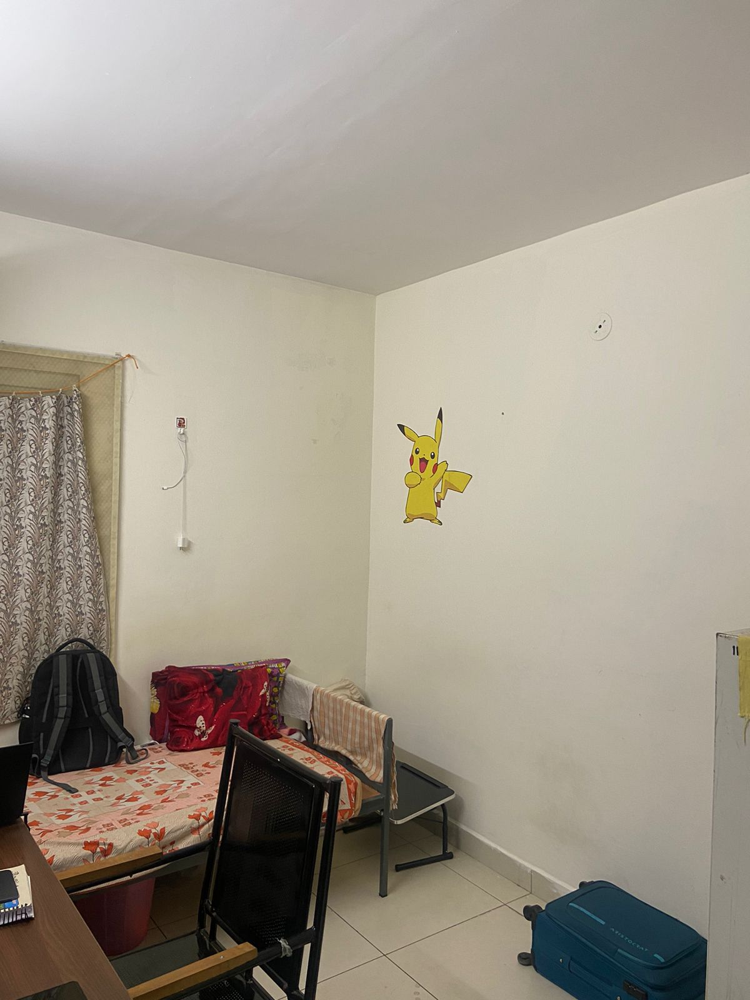

In [ ]:
image = Image.open("/content/SAMPLE_ROOM1.jpg")
image

In [ ]:
question = "what is in front of me?"

In [ ]:
# Calculate the logits
def get_labels_finetuned(model,question,,image):
    inputs = processor(image, question, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
    logits = outputs.logits.squeeze()

    # Get the top 5 indices and their corresponding values
    top5_values, top5_indices = torch.topk(logits, k=5)
    print(top5_indices)
    # Convert the indices to labels using the model's configuration
    top5_labels = [model.config.id2label[idx.item()] for idx in top5_indices]
    for label, value in zip(top5_labels, top5_values):
        print("Label:", label)
        print("Probability:", torch.sigmoid(value).item())

In [ ]:
get_labels_finetuned(model_finetuned,question,image)

tensor([ 212, 1824,   81, 1376,  548], device='cuda:0')
Label: bed
Probability: 0.7906939387321472
Label: sofa
Probability: 0.3651426434516907
Label: table
Probability: 0.0786403939127922
Label: shelves
Probability: 0.005861305166035891
Label: chair
Probability: 0.004837940447032452


## VQA from scratch

In [ ]:
class TextEmbeddings(nn.Module):
    def __init__(self, vocab_size, embedding_size, max_position_embeddings):
        super(TextEmbeddings, self).__init__()
        self.word_embeddings = nn.Embedding(vocab_size, embedding_size)
        self.position_embeddings = nn.Embedding(max_position_embeddings, embedding_size)
        self.token_type_embeddings = nn.Embedding(2, embedding_size)
        self.LayerNorm = nn.LayerNorm(embedding_size, eps=1e-12)
        self.dropout = nn.Dropout(0.0)

    def forward(self, input_ids, token_type_ids):
        seq_length = input_ids.size(1)
        position_ids = torch.arange(seq_length, dtype=torch.long, device=input_ids.device)
        position_ids = position_ids.unsqueeze(0).expand_as(input_ids)

        words_embeddings = self.word_embeddings(input_ids)
        position_embeddings = self.position_embeddings(position_ids)
        token_type_embeddings = self.token_type_embeddings(token_type_ids)

        embeddings = words_embeddings + position_embeddings + token_type_embeddings
        embeddings = self.LayerNorm(embeddings)
        embeddings = self.dropout(embeddings)
        return embeddings


In [ ]:
class ViltPatchEmbeddings(nn.Module):
    def __init__(self, embedding_size, image_size):
        super(ViltPatchEmbeddings, self).__init__()
        self.embedding_size = embedding_size
        self.image_size = image_size
        self.projection = nn.Conv2d(3, embedding_size, kernel_size=(32, 32), stride=(32, 32))

    def forward(self, images):
        resized_images = F.interpolate(images, size=self.image_size)
        patch_embeddings = self.projection(resized_images)
        return patch_embeddings

class ViltSelfAttention(nn.Module):
    def __init__(self, embedding_size):
        super(ViltSelfAttention, self).__init__()
        self.query = nn.Linear(embedding_size, embedding_size)
        self.key = nn.Linear(embedding_size, embedding_size)
        self.value = nn.Linear(embedding_size, embedding_size)
        self.dropout = nn.Dropout(0.0)

    def forward(self, input_embeddings):
        query = self.query(input_embeddings)
        key = self.key(input_embeddings)
        value = self.value(input_embeddings)

        attention_scores = torch.matmul(query, key.transpose(-1, -2))
        attention_scores = attention_scores / torch.sqrt(torch.tensor(query.size(-1)).float())
        attention_probs = F.softmax(attention_scores, dim=-1)
        attention_probs = self.dropout(attention_probs)

        context = torch.matmul(attention_probs, value)
        return context


In [ ]:
class ViltLayer(nn.Module):
    def __init__(self, embedding_size):
        super(ViltLayer, self).__init__()
        self.attention = ViltSelfAttention(embedding_size)
        self.output = nn.Linear(embedding_size, embedding_size)
        self.dropout = nn.Dropout(0.0)
        self.LayerNorm = nn.LayerNorm(embedding_size, eps=1e-12)

    def forward(self, input_embeddings):
        attention_output = self.attention(input_embeddings)
        intermediate_output = self.dropout(attention_output)
        intermediate_output = self.output(intermediate_output)
        output_embeddings = self.LayerNorm(intermediate_output + input_embeddings)
        return output_embeddings

class ViltEncoder(nn.Module):
    def __init__(self, num_layers, embedding_size):
        super(ViltEncoder, self).__init__()
        self.layer = nn.ModuleList([ViltLayer(embedding_size) for _ in range(num_layers)])

    def forward(self, input_embeddings):
        for layer_module in self.layer:
            input_embeddings = layer_module(input_embeddings)
        return input_embeddings

class ViltPooler(nn.Module):
    def __init__(self, embedding_size):
        super(ViltPooler, self).__init__()
        self.dense = nn.Linear(embedding_size, embedding_size)
        self.activation = nn.Tanh()

    def forward(self, input_embeddings):
        pooled_output = self.activation(self.dense(input_embeddings[:, 0]))
        return pooled_output

class ViltForQuestionAnswering(nn.Module):
    def __init__(self, vocab_size, embedding_size, max_position_embeddings, num_layers, num_classes,image_size):
        super(ViltForQuestionAnswering, self).__init__()
        self.text_embeddings = TextEmbeddings(vocab_size, embedding_size, max_position_embeddings)
        self.patch_embeddings = ViltPatchEmbeddings(embedding_size, image_size)
        self.encoder = ViltEncoder(num_layers, embedding_size)
        self.layernorm = nn.LayerNorm(embedding_size, eps=1e-12)
        self.pooler = ViltPooler(embedding_size)
        self.classifier = nn.Sequential(
            nn.Linear(embedding_size, embedding_size * 2),
            nn.LayerNorm(embedding_size * 2, eps=1e-5),
            nn.GELU(),
            nn.Linear(embedding_size * 2, num_classes)
        )

    def forward(self, input_ids, image, token_ids):
        batch_size = input_ids.size(0)
        text_embeddings = self.text_embeddings(input_ids, token_ids)
        patch_embeddings = self.patch_embeddings(image)
        patch_embeddings = patch_embeddings.view(batch_size, -1, self.patch_embeddings.embedding_size)  # Reshape to [batch_size, sequence_length, embedding_size]
        combined_embeddings = text_embeddings + patch_embeddings
        encoded_embeddings = self.encoder(combined_embeddings)
        pooled_output = self.pooler(encoded_embeddings)
        logits = self.classifier(pooled_output)
        return logits

In [ ]:
batch_size = 16
vocab_size = 30522
embedding_size = 768
max_position_embeddings = 40
num_layers = 12
num_classes = 3422
image_size = (40, 40)
model_from_scratch = ViltForQuestionAnswering(vocab_size, embedding_size, max_position_embeddings, num_layers, num_classes,image_size)

In [ ]:
num_epochs = 100
criterion = nn.CrossEntropyLoss()
optimizer = optimizer = torch.optim.AdamW(model_from_scratch.parameters(), lr=5e-5)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_from_scratch.to(device)

for epoch in range(num_epochs):
    model_from_scratch.train()
    total_loss = 0.0

    for batch in train_dataloader:
        for key in batch:
            batch[key] = batch[key].to(device)

        optimizer.zero_grad()
        logits = model_from_scratch(batch['input_ids'], batch['pixel_values'],batch['token_type_ids'])
        loss = criterion(logits, batch['labels'])
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    average_loss = total_loss / len(train_dataloader)
    print(f"Epoch {epoch+1}, Average Loss: {average_loss:.4f}")

Epoch 1, Average Loss: 6.0400
Epoch 2, Average Loss: 4.9184
Epoch 3, Average Loss: 4.5132
Epoch 4, Average Loss: 4.1436
Epoch 5, Average Loss: 3.7507
Epoch 6, Average Loss: 3.3685
Epoch 7, Average Loss: 2.9840
Epoch 8, Average Loss: 2.6145
Epoch 9, Average Loss: 2.2770
Epoch 10, Average Loss: 1.9526
Epoch 11, Average Loss: 1.6623
Epoch 12, Average Loss: 1.3930
Epoch 13, Average Loss: 1.2007
Epoch 14, Average Loss: 1.0086
Epoch 15, Average Loss: 0.8769
Epoch 16, Average Loss: 0.7978
Epoch 17, Average Loss: 0.7230
Epoch 18, Average Loss: 0.6698
Epoch 19, Average Loss: 0.6545
Epoch 20, Average Loss: 0.5976
Epoch 21, Average Loss: 0.5841
Epoch 22, Average Loss: 0.6080
Epoch 23, Average Loss: 0.5715
Epoch 24, Average Loss: 0.5319
Epoch 25, Average Loss: 0.5376
Epoch 26, Average Loss: 0.5400
Epoch 27, Average Loss: 0.5447
Epoch 28, Average Loss: 0.5107
Epoch 29, Average Loss: 0.5082
Epoch 30, Average Loss: 0.4991
Epoch 31, Average Loss: 0.5126
Epoch 32, Average Loss: 0.4923
Epoch 33, Average

In [ ]:
import joblib
PATH = "/content/model_scratch_3 (1).joblib"
model_from_scratch = joblib.load(PATH)

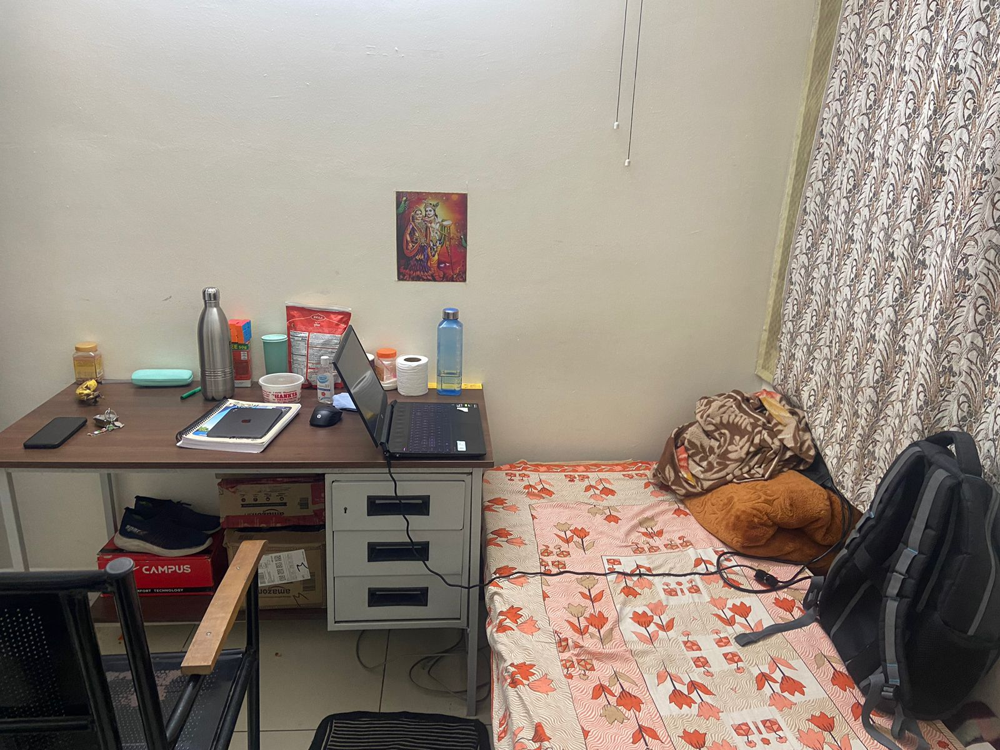

In [ ]:
image = Image.open("/content/sample_room3.jpg")
image

In [ ]:
question = "what is present here ?"

In [ ]:
def get_labels_scratch(model,question,image):
    inputs = processor(image, question, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model_from_scratch(inputs['input_ids'], inputs['pixel_values'], inputs['token_type_ids'])
    top5_values, top5_indices = torch.topk(outputs, k=5)
    top5_labels = [[config.id2label[idx.item()] for idx in indices] for indices in top5_indices]
    for labels, values in zip(top5_labels, top5_values):
        for label, value in zip(labels, values):
            print("Label:", label)
            print("Probability:", torch.sigmoid(value).item())  # Convert logits to probabilities using sigmoid
        print()
    return top5_labels


In [ ]:
labels = get_labels_scratch(model_from_scratch,question,image)

Label: garbage bin
Probability: 0.8737038373947144
Label: bed
Probability: 0.440317839384079
Label: window
Probability: 0.31280478835105896
Label: chair
Probability: 0.16311712563037872
Label: toilet
Probability: 0.12964217364788055



In [ ]:
print(labels[0])

['garbage bin', 'bed', 'window', 'chair', 'toilet']


## OBJECT LOCALISATION AND DEPTH ESTIMATION

In [ ]:
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.73k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/603M [00:00<?, ?B/s]

In [ ]:
def get_segment(prompt, image):
  inputs = processor(text=prompt, images=[image], padding="max_length", return_tensors="pt")
  # predict
  with torch.no_grad():
    outputs = model(**inputs)
  preds = outputs.logits.unsqueeze(1)
  return torch.sigmoid(preds[:,0,:]).numpy()

In [ ]:

def find_centroid(image):
    image_array = np.array(image)
    white_indices = np.argwhere(image_array > np.max(image) - 0.2)
    centroid = np.mean(white_indices, axis=0)
    centroid = np.round(centroid).astype(int)

    image_array[centroid[0], centroid[1]] = 0
    x, y = centroid[0], centroid[1]
    w = 6
    for i in range(x-w, x+w):
      for j in range(y - w, y+w):
        image_array[i, j] = 0

    center = np.array(image_array.shape) // 2
    centroid_relative = centroid - center

    x, y = center[0], center[1]
    w = 6
    for i in range(x-w, x+w):
      for j in range(y - w, y+w):
        image_array[i, j] = 0.5

    return centroid_relative, image_array, centroid  #(y, x), image, (i, j)


In [ ]:
def describe_direction_qualitatively(centroid_coords):
    y, x = centroid_coords

    if x == 0 and y == 0:
        return None

    distance = max(abs(x), abs(y))

    if distance <= 350/8:
        movement_category = "slightly"
    elif distance <= 350/4:
        movement_category = "a little bit"
    elif distance <= 350*(3/8):
        movement_category = "moderately"
    else:
        movement_category = "significantly"

    direction_description = ""

    if y < 0:
        direction_description += f"{movement_category} towards upwards direction"
        # pass
    elif y > 0:
        direction_description += f"{movement_category} towards downwards direction "

    if x < 0:
        direction_description += f", {movement_category} towards your left"
    elif x > 0:
        direction_description += f", {movement_category} towards your right"

    return f"{direction_description}."


# description = describe_direction_qualitatively(centroid)
# print(description)


In [ ]:
from transformers import pipeline

checkpoint = "vinvino02/glpn-nyu"
depth_estimator = pipeline("depth-estimation", model=checkpoint)


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/245M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


In [ ]:
def get_depth_qualitative(depth_map, point):
    # Extract depth value at centroid
    centroid_depth = depth_map[int(point[0]), int(point[1])]

    # Compute depth statistics
    min_depth = np.min(depth_map)
    max_depth = np.max(depth_map)
    mean_depth = np.mean(depth_map)
    std_depth = np.std(depth_map)

    # Define qualitative depth levels based on statistics
    depth_levels = {
        "Very Close": (min_depth, min_depth + std_depth),
        "Close": (min_depth + std_depth, mean_depth),
        "Medium": (mean_depth, max_depth - std_depth),
        "Far": (max_depth - std_depth, max_depth+1)
    }

    # Determine qualitative depth
    qualitative_depth = "Unknown"
    for depth, (min_val, max_val) in depth_levels.items():
        if min_val <= centroid_depth <= max_val:
            qualitative_depth = depth
            break

    return qualitative_depth

In [ ]:
def get_location(image_path, prompt, plots = False): # image path, prompt string(label of the object)
  image = Image.open(image_path)
  resized_image = image.resize((350, 350))
  segment = get_segment(prompt, image)
  centroid, new_img, point = find_centroid(segment)
  description1 = describe_direction_qualitatively(centroid)
  if description1 == None:
    return None
  predictions = depth_estimator(resized_image)
  map = np.array(predictions["depth"])
  depth_qualitative = get_depth_qualitative(np.array(predictions["depth"]), point)

  if plots :
    fig, ax = plt.subplots(1, 3, figsize = (15, 8))
    ax[0].imshow(image)
    ax[0].set_title("Orignal Image")
    ax[1].imshow(new_img, cmap = 'jet')
    ax[1].set_title("Location of Object")
    ax[2].imshow(map, cmap = 'gray')
    ax[2].set_title("Depth Map")
  return description1 + "It is at a " + depth_qualitative + " distance to you."


'significantly downwards, significantly to the left.It is at a Close distance to you.'

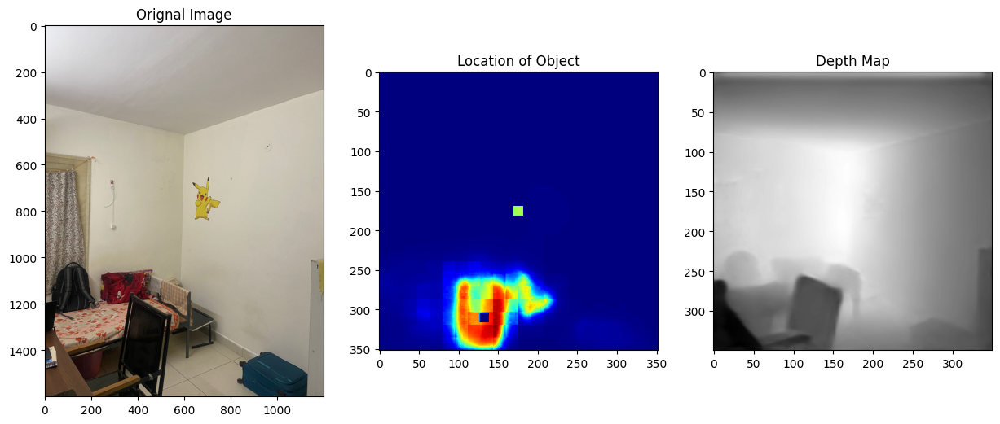

In [ ]:
get_location("/content/SAMPLE_ROOM1.jpg","Chair",True)

'significantly downwards, significantly to the left.It is at a Medium distance to you.'

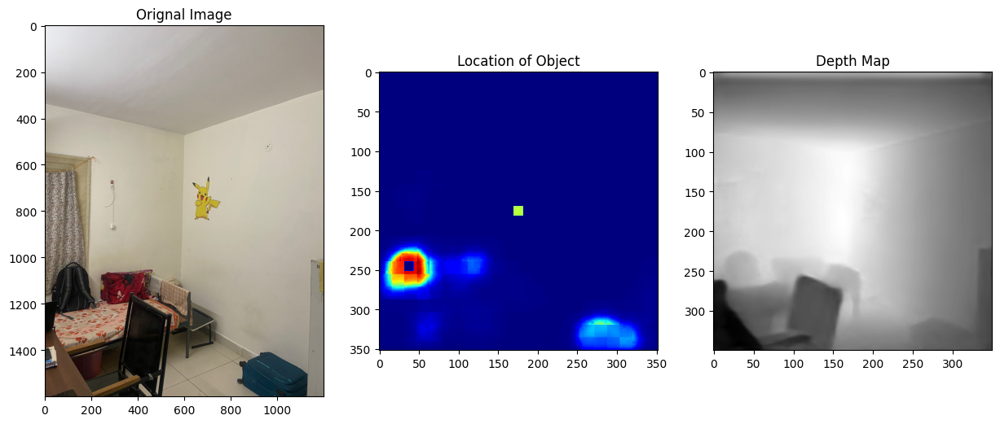

In [ ]:
get_location("/content/SAMPLE_ROOM1.jpg","Bag",True)

'moderately towards downwards direction , moderately towards your right.It is at a Close distance to you.'

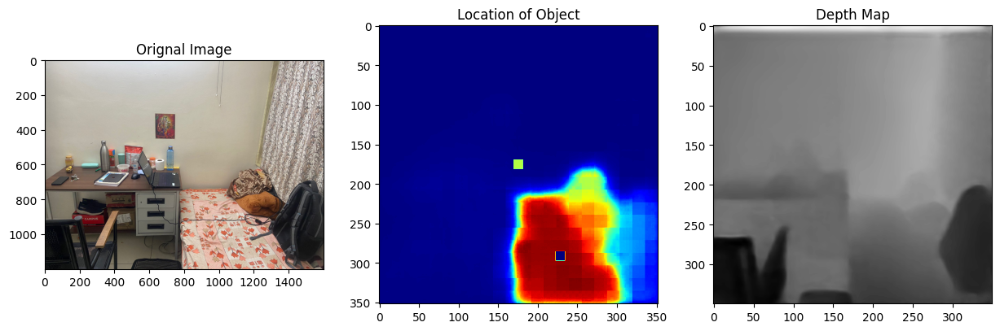

In [ ]:
get_location("/content/sample_room3.jpg","bed",True)

## COMBINED OUTPUT FROM ALL THE THREE MODELS THAT WE HAVE USED

In [ ]:
question = input()

What is present in front of me?


In [ ]:
def get_navigation(image_path,model,question,type_model):
   image = Image.open(image_path)

   if type_model == "Finetuned":
     labels = get_labels_finetuned(model_finetuned,question,image)

   elif type_model == "Scratch":
     labels = get_labels_scratch(model_from_scratch,question,image)

   description = ""

   for i in labels[0]:
    desc = get_location("/content/sample_room3.jpg","bed",False) ## False we do not want the Plots
    if desc !=
    description = desc + "," + description

   return description


# Now we will take this description from the model and put this in a LLM model and ask the LLM to give a navigation using the above information about the surroundings.

## TEXT TO AUDIO FOR NAVIGATION

After that we will take this Text generated by LLM and input it in the Teext to Audio model

In [ ]:
!pip install git+https://github.com/huggingface/parler-tts.git

  Cloning https://github.com/huggingface/parler-tts.git to /tmp/pip-req-build-3iaywxzp
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/parler-tts.git /tmp/pip-req-build-3iaywxzp
  Resolved https://github.com/huggingface/parler-tts.git to commit 10016fb0300c0dc31a0fb70e26f3affee7b62f16
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 5.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl 

In [ ]:
import torch
from parler_tts import ParlerTTSForConditionalGeneration
from transformers import AutoTokenizer
import soundfile as sf

device = "cuda:0" if torch.cuda.is_available() else "cpu"

model = ParlerTTSForConditionalGeneration.from_pretrained("parler-tts/parler_tts_mini_v0.1").to(device)
tokenizer = AutoTokenizer.from_pretrained("parler-tts/parler_tts_mini_v0.1")
description = "A male speaker with a slightly low-pitched voice delivers his words quite expressively, in a way that he is navigating a blind person in a indoor room."

config.json:   0%|          | 0.00/7.42k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.59G [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


generation_config.json:   0%|          | 0.00/267 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


In [ ]:
prompt = "Take left,on your right we can see a chair avoid that and then take a right you will feel a bed on the bed you have a pillow and a laptop"
input_ids = tokenizer(description, return_tensors="pt").input_ids.to(device)
prompt_input_ids = tokenizer(prompt, return_tensors="pt").input_ids.to(device)

generation = model.generate(input_ids=input_ids, prompt_input_ids=prompt_input_ids)
audio_arr = generation.cpu().numpy().squeeze()
sf.write("parler_tts_out.wav", audio_arr, model.config.sampling_rate)

In [ ]:
ipd.Audio('/kaggle/working/parler_tts_out.wav')